# Model Loading and Inference

source: https://mlflow.org/docs/latest/ml/traditional-ml/prophet/

Load and use logged Prophet models:

In [131]:
# Load Data
site_name = "Kogenheim"
code_site ="A2360030"
code_station = "A236003001"
# csv_file_path0 = f"E:\\Formations\\Jedha\\02_FullStack\\M11F_Final_Project\\Prevision_des_crues\\nowcast-flood-risk\\src\\dz\\data\\vars\\hubeau_obs_elab_{site_name}_{code_site}_{code_station}_HIXnJ_20070101_20260602.csv"
# csv_file_path = f"E:\\Formations\\Jedha\\02_FullStack\\M11F_Final_Project\\Prevision_des_crues\\nowcast-flood-risk\\src\\dz\\data\\vars\\hubeau_obs_elab_{site_name}_{code_station}_HIXnJ_20070101_20260602.csv"

s3_URI = f"s3://jedha-dz-dsft41/Final_Project_Forecasting/Dataset/hubeau_api/VARS/cleaned/hubeau_obs_elab_{site_name}_{code_site}_{code_station}_HIXnJ_20070101_20260605.csv"
data_df = pd.read_csv(s3_URI)
data_df

,code_site,code_station,date_obs_elab,resultat_obs_elab,date_prod,code_statut,libelle_statut,code_methode,libelle_methode,code_qualification,libelle_qualification,longitude,latitude,grandeur_hydro_elab
0,A2360030,A236003001,2007-01-01,1207.0,2026-05-31T20:23:34Z,16,Donnée validée,10,Expertisée,20,Bonne,7.546574,48.337015,HIXnJ
1,A2360030,A236003001,2007-01-02,1554.0,2026-05-31T20:23:34Z,16,Donnée validée,10,Expertisée,20,Bonne,7.546574,48.337015,HIXnJ
2,A2360030,A236003001,2007-01-03,1675.0,2026-05-31T20:23:34Z,16,Donnée validée,10,Expertisée,20,Bonne,7.546574,48.337015,HIXnJ
3,A2360030,A236003001,2007-01-04,1677.0,2026-05-31T20:23:34Z,16,Donnée validée,10,Expertisée,20,Bonne,7.546574,48.337015,HIXnJ
4,A2360030,A236003001,2007-01-05,1590.0,2026-05-31T20:23:34Z,16,Donnée validée,10,Expertisée,20,Bonne,7.546574,48.337015,HIXnJ
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7091,A2360030,A236003001,2026-06-01,593.0,2026-06-03T21:45:59Z,12,Donnée pré-validée,10,Expertisée,20,Bonne,7.546574,48.337015,HIXnJ
7092,A2360030,A236003001,2026-06-02,627.0,2026-06-03T21:45:59Z,12,Donnée pré-validée,10,Expertisée,20,Bonne,7.546574,48.337015,HIXnJ
7093,A2360030,A236003001,2026-06-03,626.0,2026-06-04T21:46:09Z,12,Donnée pré-validée,10,Expertisée,20,Bonne,7.546574,48.337015,HIXnJ
7094,A2360030,A236003001,2026-06-04,614.0,2026-06-05T21:46:14Z,4,Donnée brute,0,Mesurée,16,Non qualifiée,7.546574,48.337015,HIXnJ


In [118]:
# -*- coding=utf-8 -*-
import pandas as pd
import numpy

# Import Prophet and its diagnostics tools for time series forecasting and model evaluation, allowing us to build a forecasting model for the water height variable and assess its performance using cross-validation techniques.
from prophet import Prophet

# Import MLflow and its Prophet integration to log the model training process, parameters, metrics, and artifacts to a tracking server (Neon DB) for better experiment management and reproducibility.
import mlflow
import mlflow.prophet
# from mlflow import prophet as mlflow_prophet
from prophet.diagnostics import cross_validation, performance_metrics
from sklearn.metrics import  (r2_score, mean_squared_error, root_mean_squared_error, mean_absolute_error, mean_absolute_percentage_error)

# Import joblib and pickle for model serialization
import pickle
import joblib

# Import plotly for interactive visualizations
from plotly import express as px
from plotly import graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode, iplot

from pathlib import Path
import os
import shutil
from datetime import datetime

# Import the load_dotenv function to read key-value pairs from a .env file into the OS environment
from dotenv import load_dotenv


# =======================================================================
# ENVIRONMENT VARIABLES SETUP
# =======================================================================
# Execute the load_dotenv function to populate os.environ with variables from the .env file
load_dotenv()

# Set environment variable for MLflow tracking URI to use local file-based storage (optional, defaults to local file-based storage)
# Retrieve the MLFLOW_TRACKING_URI (Neon DB URL) from the environment variables
# os.environ["MLFLOW_TRACKING_URI"] = "file:./mlruns"
MLFLOW_TRACKING_URI = os.getenv("MLFLOW_TRACKING_URI")

Current_time="2026-06-07_12-40-42" #"2026-06-06_08-03-38"
REGISTERED_MODEL_NAME="flood_forecast_model"
# Alias for the registered model version, can be used to point to the latest version or a specific version for easier reference in deployment and inference.
MODEL_ALIAS_NAME = "challenge"
# MODEL_ALIAS_NAME = f"challenge_{Current_time}"
# If you do not want aliases yet, Use explicit version URI instead:
# MODEL_ALIAS_NAME = "1"  # Replace with the actual version number you want to reference

MODEL_INFO_NAME = f"prophet_model_{Current_time}"
EXPERIMENT_NAME = f"flood_forecast_experiment_{Current_time}"
EXPERIMENT_ID = "1"  # Replace with the actual experiment ID if you want to reference by ID instead of name
# RUN_ID = "eaeb934acefe4d2598708eec3bb4e818"

# Construct the model URI using the registered model name and alias (or version)
MODEL_URI = f"models:/{REGISTERED_MODEL_NAME}@{MODEL_ALIAS_NAME}"
# MODEL_URI = "runs:/<run_id>/prophet_model"
# MODEL_URI=f"runs:/{RUN_ID}/{MODEL_INFO_NAME}"

# get run id from model URI saved in mlflow: alias → version → run_id
client = mlflow.MlflowClient(tracking_uri=MLFLOW_TRACKING_URI)
mv = client.get_model_version_by_alias(REGISTERED_MODEL_NAME, MODEL_ALIAS_NAME)
RUN_ID = mv.run_id
MODEL_VERSION = mv.version
artifacts_path = f"runs:/{RUN_ID}/{MODEL_INFO_NAME}"
# get train artifacts path from model URI saved in mlflow
artifacts_path2 = mlflow.get_artifact_uri(MODEL_INFO_NAME)

print(f"Constructed MODEL_URI: {MODEL_URI}")
print(f"Retrieved RUN_ID from model alias '{MODEL_ALIAS_NAME}': {RUN_ID}")
print(f"Retrieved MODEL_VERSION from model alias '{MODEL_ALIAS_NAME}': {MODEL_VERSION}")
print(f"Train artifacts path from MODEL_URI: {artifacts_path}")
print(f"Train artifacts path from MODEL_INFO_NAME: {artifacts_path2}")

# list all registered models and their versions to verify the correct model and version are being referenced
# registered_models = client.list_registered_models()
registered_models = client.search_registered_models()
print("\nRegistered Models and Versions:")
for rm in registered_models:
    print(f"Model Name: {rm.name}")
    # for mv in rm.latest_versions:
    for mv in client.search_model_versions(f"name='{rm.name}'"):
        print(f"  Version: {mv.version}, Alias {mv.aliases}, Stage: {mv.current_stage}, Run ID: {mv.run_id}")


Constructed MODEL_URI: models:/flood_forecast_model@challenge
Retrieved RUN_ID from model alias 'challenge': 324d7f0a62b6429bb0606f2cb5756a7b
Retrieved MODEL_VERSION from model alias 'challenge': 17
Train artifacts path from MODEL_URI: runs:/324d7f0a62b6429bb0606f2cb5756a7b/prophet_model_2026-06-07_12-40-42
Train artifacts path from MODEL_INFO_NAME: s3://mlflow-bucket-41-dz/mlflow_artifacts/0/e363e53c24c54012b42c392e721a97a0/artifacts/prophet_model_2026-06-07_12-40-42

Registered Models and Versions:
Model Name: flood_forecast_model
  Version: 17, Alias [], Stage: Production, Run ID: 324d7f0a62b6429bb0606f2cb5756a7b
  Version: 16, Alias [], Stage: None, Run ID: 5596e0fdb0cf4592a5930ad42ffaf36b
  Version: 15, Alias [], Stage: None, Run ID: 324d7f0a62b6429bb0606f2cb5756a7b
  Version: 12, Alias [], Stage: Production, Run ID: 299efd03f9fd4f2ba1298bf2d43460f6
  Version: 14, Alias [], Stage: None, Run ID: 299efd03f9fd4f2ba1298bf2d43460f6
  Version: 13, Alias [], Stage: None, Run ID: a30f6f3f

In [119]:
# Load as native Prophet model using the model URI, which will automatically resolve the alias to the correct version
loaded_prophet_model = mlflow.prophet.load_model(MODEL_URI) # == prophet_model defined from train.py

# Generate forecast
# Periods: Number of future time points to predict (e.g., 365 for one year of daily predictions)
# for N years of daily predictions, use periods=365 * N
# The make_future_dataframe method creates a DataFrame that extends the historical data with future dates, which is then used to generate forecasts using 
# the predict method of the loaded Prophet model.
NUM_YEARS_TO_PREDICT = 3
future = loaded_prophet_model.make_future_dataframe(periods=365 * NUM_YEARS_TO_PREDICT)
forecast = loaded_prophet_model.predict(future)

# Load as PyFunc for generic inference
pyfunc_model = mlflow.pyfunc.load_model(MODEL_URI)
future_dates = pd.date_range(start="2024-01-01", end="2026-06-30", freq="D")
predictions = pyfunc_model.predict(pd.DataFrame({"ds": future_dates}))

In [120]:
predictions

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2024-01-01,1027.592132,922.352426,1773.355246,1027.592132,1027.592132,339.305511,339.305511,339.305511,-101.702631,...,4.583788,4.583788,4.583788,436.424355,436.424355,436.424355,0.0,0.0,0.0,1366.897643
1,2024-01-02,1027.626016,978.958645,1789.717712,1027.626016,1027.626016,336.223022,336.223022,336.223022,-101.702631,...,3.639447,3.639447,3.639447,434.286206,434.286206,434.286206,0.0,0.0,0.0,1363.849039
2,2024-01-03,1027.659901,930.630970,1772.625227,1027.659901,1027.659901,328.490047,328.490047,328.490047,-101.702631,...,-1.038335,-1.038335,-1.038335,431.231013,431.231013,431.231013,0.0,0.0,0.0,1356.149948
3,2024-01-04,1027.693786,960.881096,1752.485723,1027.693786,1027.693786,320.367568,320.367568,320.367568,-101.702631,...,-5.328515,-5.328515,-5.328515,427.398715,427.398715,427.398715,0.0,0.0,0.0,1348.061354
4,2024-01-05,1027.727670,911.849205,1774.425063,1027.727670,1027.727670,318.045505,318.045505,318.045505,-101.702631,...,-3.188078,-3.188078,-3.188078,422.936214,422.936214,422.936214,0.0,0.0,0.0,1345.773176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
907,2026-06-26,1058.325567,340.171892,1198.665985,1009.718163,1119.129753,-275.919538,-275.919538,-275.919538,-101.702631,...,-3.188078,-3.188078,-3.188078,-171.028829,-171.028829,-171.028829,0.0,0.0,0.0,782.406030
908,2026-06-27,1058.359452,343.071273,1187.722479,1009.704218,1119.305659,-278.769881,-278.769881,-278.769881,-101.702631,...,-1.719480,-1.719480,-1.719480,-175.347770,-175.347770,-175.347770,0.0,0.0,0.0,779.589571
909,2026-06-28,1058.393337,355.251198,1159.668019,1009.690274,1119.481565,-278.573372,-278.573372,-278.573372,-101.702631,...,3.051173,3.051173,3.051173,-179.921914,-179.921914,-179.921914,0.0,0.0,0.0,779.819965
910,2026-06-29,1058.427221,373.266085,1196.993945,1009.677900,1119.629108,-281.832966,-281.832966,-281.832966,-101.702631,...,4.583788,4.583788,4.583788,-184.714122,-184.714122,-184.714122,0.0,0.0,0.0,776.594256


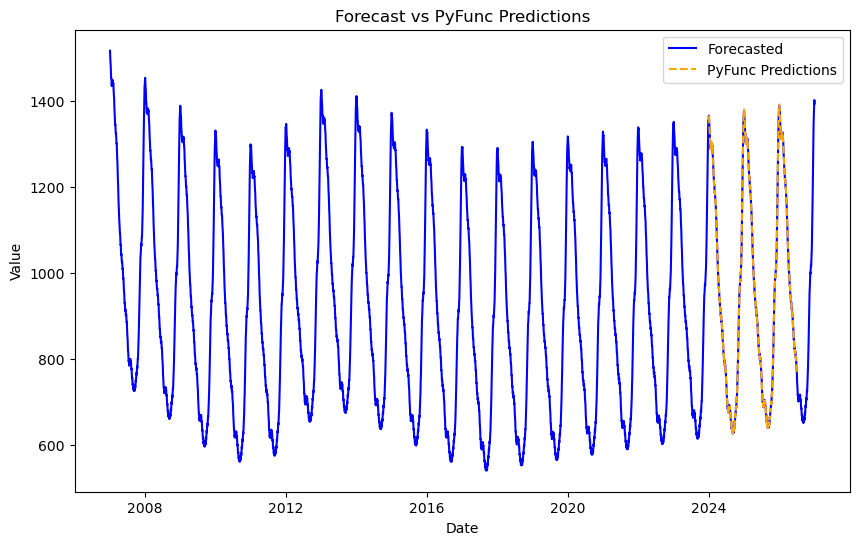

In [121]:
# Plot the forecasted results
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.plot(forecast['ds'], forecast['yhat'], label='Forecasted', color='blue')
plt.plot(future_dates, predictions['yhat'], label='PyFunc Predictions', color='orange', linestyle='--')
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('Forecast vs PyFunc Predictions')
plt.legend()
plt.show()

C:\Users\zef\AppData\Local\Temp\ipykernel_64240\3084572097.py:4: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig5.show()


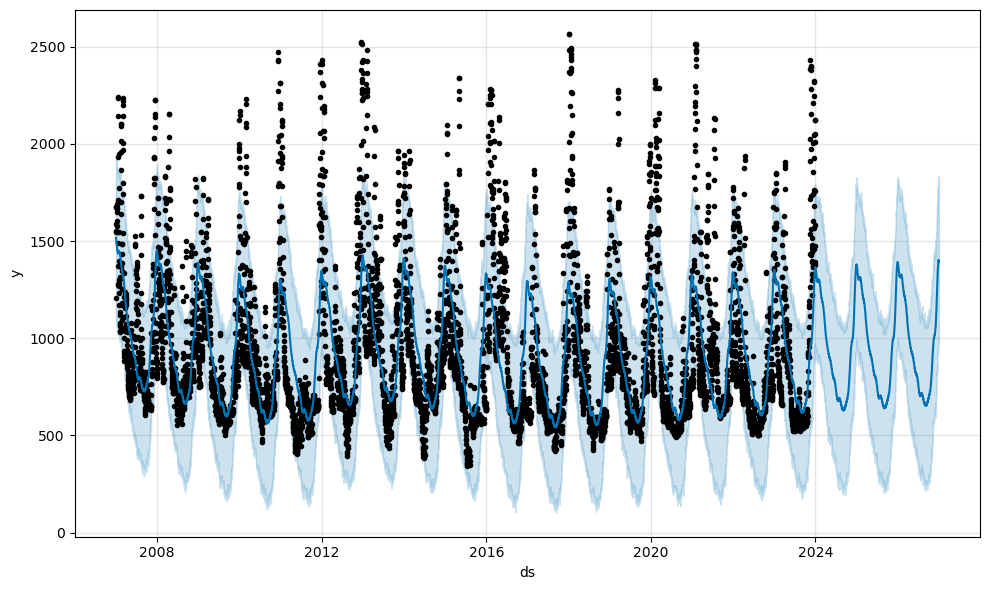

In [122]:
# Plot the forecasted results
fig5 = loaded_prophet_model.plot(forecast)
# fig5.savefig(local_artifact_dir / f"05_prophet_forecast_plot_{FILE_POSTFIX_NAME}.png")
fig5.show()

In [129]:
# Load the training and testing datasets from the specified S3 URI artifacts, which contain the preprocessed data used for training and evaluating the Prophet model. These datasets are essential for understanding the model's performance and making predictions based on historical water height data.
train_fbp_uri="s3://mlflow-bucket-41-dz/mlflow_artifacts/6d62e0fa20044a5f9375eb64f2327f12/artifacts/train_fbp_Kogenheim_A2360030_A236003001_HIXnJ.csv"
test_fbp_uri="s3://mlflow-bucket-41-dz/mlflow_artifacts/6d62e0fa20044a5f9375eb64f2327f12/artifacts/test_fbp_Kogenheim_A2360030_A236003001_HIXnJ.csv"

train_fbp = pd.read_csv(train_fbp_uri)
test_fbp = pd.read_csv(test_fbp_uri)

In [124]:
TITLE_POSTFIX_NAME = MODEL_ALIAS_NAME 

# Plot the forecasted results using plotly
fig6 = go.Figure()
fig6.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat'], mode='lines', name='Forecasted Water Height (yhat)'))
fig6.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], mode='lines', name='Lower Confidence Interval (yhat_lower)', line=dict(dash='dash', color='red')))
fig6.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], mode='lines', name='Upper Confidence Interval (yhat_upper)', line=dict(dash='dash', color='green')))
# Customize the layout of the figure
fig6.update_layout(title=f'Prophet Forecast - Water Height Over Time - {TITLE_POSTFIX_NAME}',
                title_x=0.5,
                    title_font=dict(size=24, color='black', family='Arial', weight='bold'),
                    xaxis_title='Datetime', 
                    yaxis_title='Water Height',
                    legend_title='Legend',
                #   showlegend=True,
                #   legend=dict(x=0.01, y=0.99, bgcolor='rgba(255, 255, 255, 0.5)', bordercolor='black', borderwidth=1),
                    height=900, width=1200)
# save the figure as an HTML and png file
# fig6.write_html(local_artifact_dir / f"06_prophet_forecast_plot_{FILE_POSTFIX_NAME}.html")
# fig6.write_image(local_artifact_dir / f"06_prophet_forecast_plot_{FILE_POSTFIX_NAME}.png")
fig6.show()

In [125]:
# Plot the forecast with confidence intervals and actual history using plotly with interactive plot and range slider options
# We visualize the forecast, confidence intervals, and actual history.
# Use plotly only to visualize the forecast, confidence intervals, and actual history with interactive plot and range slider options
fig7 = go.Figure()
# Add the actual training data
fig7.add_trace(go.Scatter(x=train_fbp['ds'], y=train_fbp['y'], mode='lines+markers', name='Actual (Training)', line=dict(color='blue')))
# Add the actual test data
fig7.add_trace(go.Scatter(x=test_fbp['ds'], y=test_fbp['y'], mode='lines+markers', name='Actual (Test)', line=dict(color='green')))
# Add the forecast line
fig7.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat'], mode='lines', name='Forecast', line=dict(color='red')))
# Add confidence interval upper bound (invisible line to define fill boundary)
fig7.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill=None, mode='lines', 
                        line_color='rgba(0,0,0,0)', showlegend=False))
# Add confidence interval lower bound with fill to upper bound
fig7.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='lines', 
                        line_color='rgba(0,0,0,0)', name='Confidence Interval', 
                        fillcolor='rgba(255,0,0,0.2)'))
# Update layout with range selector buttons and range slider
fig7.update_layout(
    title=f"Prophet Forecast - Water Height Over Time - {TITLE_POSTFIX_NAME}",
    xaxis_title="Date",
    yaxis_title="Water Height",
    legend_title="Legend",
    width=1280,
    height=600,
    xaxis=dict(
        # Define the range selector with buttons
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1d", step="day", stepmode="backward"),
                dict(count=7, label="7d", step="day", stepmode="backward"),
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=3, label="3m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        # Add a range slider to the x-axis
        rangeslider=dict(visible=True),
        # Set the x-axis type to date
        type="date"
    )
)
# save the figure as an HTML and png file
# fig7.write_html(local_artifact_dir / f"07_prophet_forecast_with_history_plot_{FILE_POSTFIX_NAME}.html")
# fig7.write_image(local_artifact_dir / f"07_prophet_forecast_with_history_plot_{FILE_POSTFIX_NAME}.png")
fig7.show()

In [126]:
# =============================================== fig 7 bis

# Plot the forecast with confidence intervals and actual history using plotly with interactive plot and range slider options
# We visualize the forecast, confidence intervals, and actual history.
# Use plotly only to visualize the forecast, confidence intervals, and actual history with interactive plot and range slider options
fig7 = go.Figure()
# Add the actual training data
fig7.add_trace(go.Scatter(x=train_fbp['ds'], y=train_fbp['y'], mode='lines+markers', name='Actual (Training)', line=dict(color='blue')))
# Add the actual test data
fig7.add_trace(go.Scatter(x=test_fbp['ds'], y=test_fbp['y'], mode='lines+markers', name='Actual (Test)', line=dict(color='green')))
# Add the forecast line
fig7.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat'], mode='lines', name='Forecast', line=dict(color='red')))
# Add confidence interval upper bound (invisible line to define fill boundary)
fig7.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill=None, mode='lines', 
                        line_color='rgba(0,0,0,0)', showlegend=False))
# Add confidence interval lower bound with fill to upper bound
fig7.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='lines', 
                        line_color='rgba(0,0,0,0)', name='Confidence Interval', 
                        fillcolor='rgba(255,0,0,0.2)'))

# add horizontal line for flood threshold (example: 2.86) in April 1983
fig7.add_hline(y=2.86*1000, line_dash="dash", line_color="red", annotation_text=f"Flood Threshold ({2.86*1000}) in April 1983", annotation_position="top left")
# add horizontal line for flood threshold (example: 2.77) in February 1990
fig7.add_hline(y=2.77*1000, line_dash="dash", line_color="cyan", annotation_text=f"Flood Threshold ({2.77*1000}) in February 1990", annotation_position="bottom left")
# add horizontal line for flood threshold (example: 2.58) in January 2018
fig7.add_hline(y=2.58*1000, line_dash="dash", line_color="green", annotation_text=f"Flood Threshold ({2.58*1000}) in January 2018", annotation_position="bottom left")

# Update layout with range selector buttons and range slider
fig7.update_layout(
    title=f"Prophet Forecast - Water Height Over Time - {TITLE_POSTFIX_NAME}",
    xaxis_title="Date",
    yaxis_title="Water Height",
    legend_title="Legend",
    width=1280,
    height=600,
    xaxis=dict(
        # Define the range selector with buttons
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1d", step="day", stepmode="backward"),
                dict(count=7, label="7d", step="day", stepmode="backward"),
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=3, label="3m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        # Add a range slider to the x-axis
        rangeslider=dict(visible=True),
        # Set the x-axis type to date
        type="date"
    )
)
# save the figure as an HTML and png file
# fig7.write_html(local_artifact_dir / f"07_prophet_forecast_with_history_plot_{FILE_POSTFIX_NAME}.html")
# fig7.write_image(local_artifact_dir / f"07_prophet_forecast_with_history_plot_{FILE_POSTFIX_NAME}.png")
fig7.show()

# Compute Metrics

In [59]:
# =======================================================================
# VI) Compute the metrics (MAPE, R^2, RMSE, MAE) to evaluate the forecast accuracy
# =======================================================================

# We now measure how accurate the forecast is. If there’s no overlap in dates, it warns you instead of crashing.

#VI.1. Align predictions with actuals
# Join actual water height with model predictions on matching dates to compare them directly.

# Join actual closing prices with model predictions on matching dates to compare them directly.
# We merge the test dataframe (which contains the actual closing prices for the test period) with the forecast dataframe (which contains the predicted values for the same period) on the "ds" column, 
# which represents the dates.
# The merge is done using an inner join, which means that only the rows with matching dates in both dataframes will be included in the resulting merged dataframe.
# merged = pd.merge(test_fbp, forecast[["ds", "yhat"]], on="ds", how="inner")
merged = pd.concat([test_fbp, forecast[["ds", "yhat"]]], axis=1, join="inner")

print("\nMerged dataframe created:")
print(type(merged))
print("\nThe first 5 rows of the merged dataframe:")
display(merged)

# VI.2. Compute (r2_score, mean_squared_error, root_mean_squared_error, mean_absolute_error, mean_absolute_percentage_error)
# We now measure how accurate the forecast is. If there’s no overlap in dates, it warns you instead of crashing.

mape = float("nan")
r2 = float("nan")
mse = float("nan")
rmse = float("nan")
mae = float("nan")
prophet_metrics = {}

if merged.empty:
    # If the merged dataframe is empty, it means there are no overlapping dates between the test set and the forecasted values, 
    # so we print a message indicating that.
    print("No overlapping dates between forecast and test set.")
else:
    y_actual, y_predicted = merged["y"], merged["yhat"]
    # If the merged dataframe is not empty, it means there are overlapping dates between the test set and the forecasted values, 
    # calculate the Mean Absolute Percentage Error (MAPE) between the actual values (y) and the predicted values (yhat).
    mape = mean_absolute_percentage_error(y_actual, y_predicted)
    # calculate the r^2 score
    r2 = r2_score(y_actual, y_predicted)
    # calculate the mean squared error (MSE)
    mse = mean_squared_error(y_actual, y_predicted)
    # calculate the root mean squared error (RMSE)
    rmse = root_mean_squared_error(y_actual, y_predicted) # = np.sqrt(mse)
    # calculate the mean absolute error (MAE)
    mae = mean_absolute_error(y_actual, y_predicted)
    
    #save prophet metrics into a dictionary for later logging to MLflow
    prophet_metrics = {"std_mape": mape,
                        "std_r2": r2,
                        "std_mse": mse,
                        "std_rmse": rmse,
                        "std_mae": mae}
    
    print(f"\n[INFO] Baseline Run ID: {RUN_ID}")
    print("===="*20)
    print("Baseline metrics computed successfully.")
    print("===="*20)
    print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}")
    print(f"R^2 score: {r2:.2f}")
    print(f"Mean Squared Error (MSE): {mse:.2f}")
    print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
    print(f"Mean Absolute Error (MAE): {mae:.2f}")



Merged dataframe created:
<class 'pandas.core.frame.DataFrame'>

The first 5 rows of the merged dataframe:


,ds,y,ds,yhat
0,2024-01-02,1492.0,2007-01-01,1517.841171
1,2024-01-03,1807.0,2007-01-02,1514.339344
2,2024-01-04,1980.0,2007-01-03,1506.221181
3,2024-01-05,2250.0,2007-01-04,1497.749717
4,2024-01-06,2316.0,2007-01-05,1495.116089
...,...,...,...,...
878,2026-05-29,574.0,2009-05-28,814.305265
879,2026-05-30,567.0,2009-05-29,812.327049
880,2026-05-31,572.0,2009-05-30,809.824472
881,2026-06-01,594.0,2009-05-31,810.801555



[INFO] Baseline Run ID: eaeb934acefe4d2598708eec3bb4e818
Baseline metrics computed successfully.
Mean Absolute Percentage Error (MAPE): 0.25
R^2 score: 0.30
Mean Squared Error (MSE): 106514.04
Root Mean Squared Error (RMSE): 326.36
Mean Absolute Error (MAE): 250.03


# Hyperparameter Optimization

Track Prophet hyperparameter tuning experiments with MLflow:

source: https://facebook.github.io/prophet/docs/diagnostics.html#hyperparameter-tuning

## Using scikit-learn for Hyperparameter Tuning of Prophet Models

In [127]:
# using scikit-learn for hyperparameter tuning of Prophet models

import numpy as np
import pandas as pd
from prophet import Prophet
from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit, RandomizedSearchCV
from sklearn.metrics import mean_absolute_percentage_error


class ProphetEstimator(BaseEstimator, RegressorMixin):
    """Scikit-learn compatible wrapper around Prophet."""

    def __init__(
        self,
        changepoint_prior_scale=0.05,
        seasonality_prior_scale=10.0,
        holidays_prior_scale=10.0,
        seasonality_mode="additive",
        yearly_seasonality=True,
        weekly_seasonality=True,
        daily_seasonality=False, # We set daily seasonality to False because our data is daily and we don't expect a strong daily pattern, but you can experiment with this as well.
        # hourly_seasonality=False, # We set hourly seasonality to False because our data is daily and we don't expect a strong hourly pattern, but you can experiment with this as well.
    ):
        self.changepoint_prior_scale = changepoint_prior_scale
        self.seasonality_prior_scale = seasonality_prior_scale
        self.holidays_prior_scale = holidays_prior_scale
        self.seasonality_mode = seasonality_mode
        self.yearly_seasonality = yearly_seasonality
        self.weekly_seasonality = weekly_seasonality
        self.daily_seasonality = daily_seasonality
        # self.hourly_seasonality = hourly_seasonality

    def fit(self, X, y):
        X_df = pd.DataFrame(X).copy()
        if "ds" not in X_df.columns:
            X_df.columns = ["ds"]
        train_df = X_df.copy()
        train_df["y"] = np.asarray(y)

        self.model_ = Prophet(
            changepoint_prior_scale=self.changepoint_prior_scale,
            seasonality_prior_scale=self.seasonality_prior_scale,
            holidays_prior_scale=self.holidays_prior_scale,
            seasonality_mode=self.seasonality_mode,
            yearly_seasonality=self.yearly_seasonality,
            weekly_seasonality=self.weekly_seasonality,
            daily_seasonality=self.daily_seasonality,
            # hourly_seasonality=self.hourly_seasonality,
        )
        self.model_.fit(train_df)
        return self

    def predict(self, X):
        X_df = pd.DataFrame(X).copy()
        if "ds" not in X_df.columns:
            X_df.columns = ["ds"]
        forecast = self.model_.predict(X_df)
        return forecast["yhat"].to_numpy()

    def score(self, X, y):
        y_pred = self.predict(X)
        # GridSearchCV/RandomizedSearchCV maximizes score, so use negative MAPE (smaller MAPE is better)
        return -mean_absolute_percentage_error(y, y_pred)


# Build training matrices from your already-loaded Prophet dataframe (must include ds, y)
X = train_fbp[["ds"]].copy()
y = train_fbp["y"].copy()

hyper_params = {
    "changepoint_prior_scale": [0.001, 0.01, 0.05, 0.1, 0.3, 0.5], #[0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.5]
    "seasonality_prior_scale": [0.01, 1.0, 5.0, 10.0], #[0.01, 1.0, 2.0, 5.0, 8.0, 10.0]
    "holidays_prior_scale": [1.0, 5.0, 10.0], #[1.0, 2.0, 5.0, 8.0, 10.0]
    "seasonality_mode": ["additive", "multiplicative"],
}

# We use TimeSeriesSplit for cross-validation to ensure that the temporal order of the data is respected during 
# training and validation, which is crucial for time series forecasting tasks.
NUM_SPLITS = 4+1*0
tscv = TimeSeriesSplit(n_splits=NUM_SPLITS)

### GridSearchCV with Prophet

In [128]:
grid_search = GridSearchCV(
    estimator=ProphetEstimator(),
    param_grid=hyper_params,
    cv=tscv,
    scoring="neg_mean_absolute_percentage_error",
    n_jobs=4,
    verbose=1,
    # random_state=42, # GridSearchCV does not have a random_state parameter, but RandomizedSearchCV does. If you switch to RandomizedSearchCV, you can set random_state for reproducibility.
)

grid_search.fit(X, y)

best_mape = -grid_search.best_score_
print("Best Params:", grid_search.best_params_)
print(f"Best CV MAPE: {best_mape:.6f}")

# After finding the best hyperparameters, we can access the best Prophet model from the grid search results. 
# The best_estimator_ attribute of the grid search object contains the estimator with the best found parameters, 
# and we can access the underlying Prophet model using the model_ attribute of our custom ProphetEstimator wrapper.
best_prophet_model_grid = grid_search.best_estimator_.model_

Fitting 4 folds for each of 144 candidates, totalling 576 fits


13:17:21 - cmdstanpy - INFO - Chain [1] start processing
13:17:21 - cmdstanpy - INFO - Chain [1] done processing


Best Params: {'changepoint_prior_scale': 0.001, 'holidays_prior_scale': 1.0, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}
Best CV MAPE: 0.274757


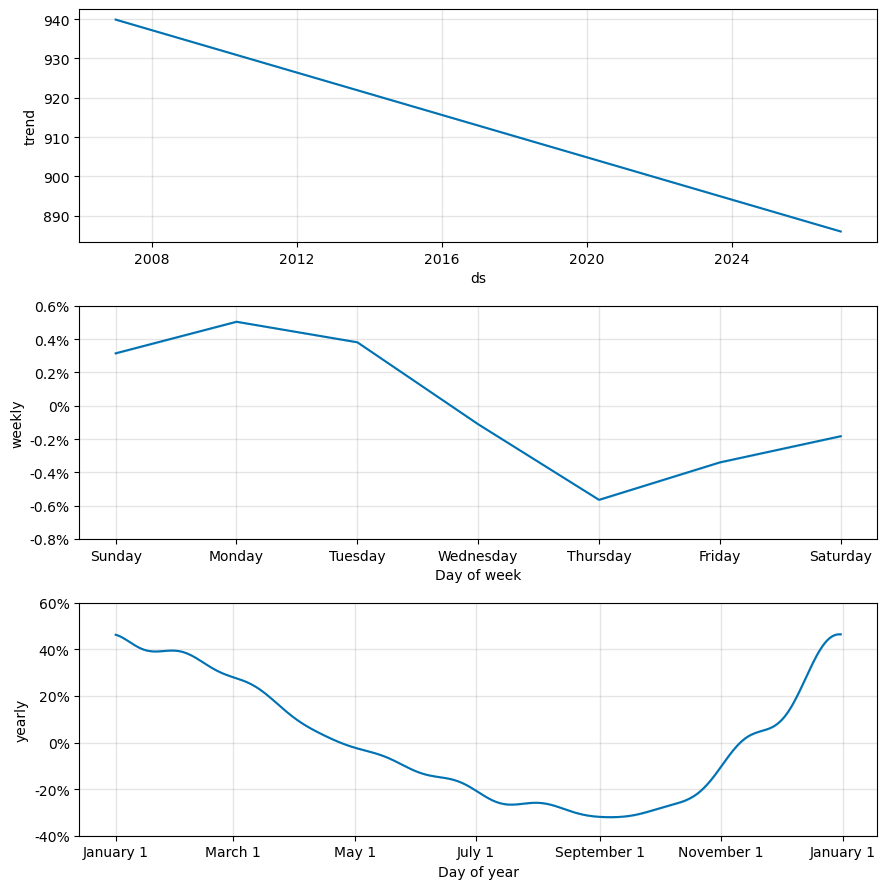

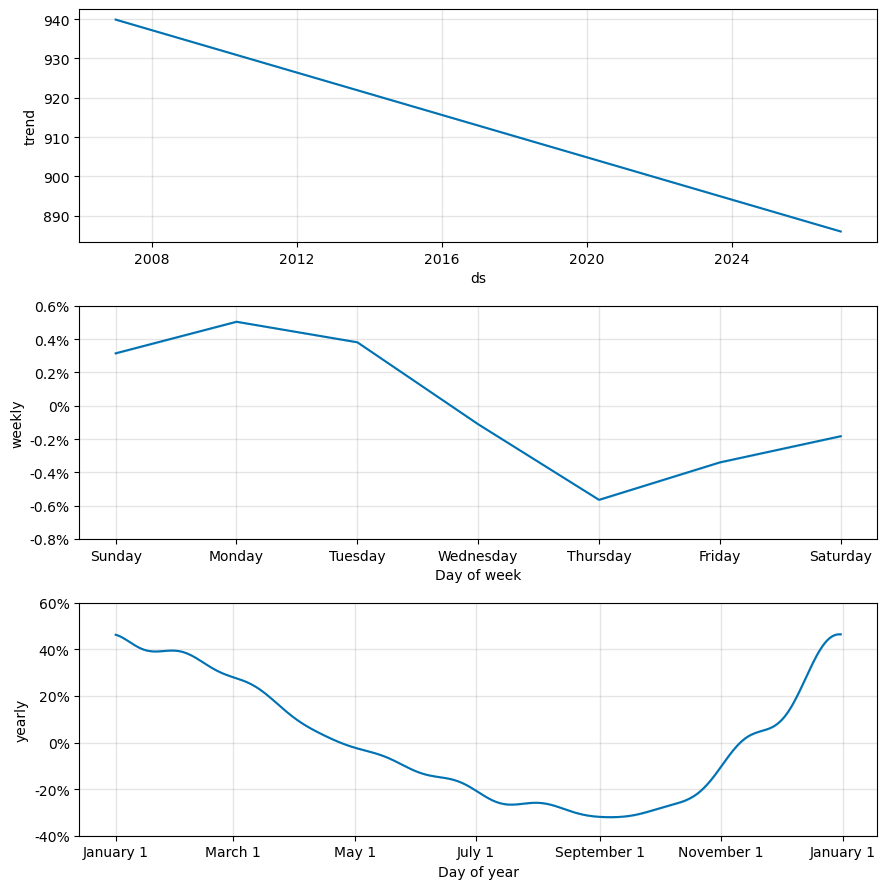

In [93]:
# Generate forecast using the best Prophet model from the grid search
future_grid = best_prophet_model_grid.make_future_dataframe(periods=365 * NUM_YEARS_TO_PREDICT)
forecast_grid = best_prophet_model_grid.predict(future_grid)

best_prophet_model_grid.plot_components(forecast_grid)

In [94]:
# =============================================== fig 7 bis

# Plot the forecast with confidence intervals and actual history using plotly with interactive plot and range slider options
# We visualize the forecast, confidence intervals, and actual history.
# Use plotly only to visualize the forecast, confidence intervals, and actual history with interactive plot and range slider options
fig7 = go.Figure()
# Add the actual training data
fig7.add_trace(go.Scatter(x=train_fbp['ds'], y=train_fbp['y'], mode='lines+markers', name='Actual (Training)', line=dict(color='blue')))
# Add the actual test data
fig7.add_trace(go.Scatter(x=test_fbp['ds'], y=test_fbp['y'], mode='lines+markers', name='Actual (Test)', line=dict(color='green')))
# Add the forecast line
fig7.add_trace(go.Scatter(x=forecast_grid['ds'], y=forecast_grid['yhat'], mode='lines', name='Forecast', line=dict(color='red')))
# Add confidence interval upper bound (invisible line to define fill boundary)
fig7.add_trace(go.Scatter(x=forecast_grid['ds'], y=forecast_grid['yhat_upper'], fill=None, mode='lines', 
                        line_color='rgba(0,0,0,0)', showlegend=False))
# Add confidence interval lower bound with fill to upper bound
fig7.add_trace(go.Scatter(x=forecast_grid['ds'], y=forecast_grid['yhat_lower'], fill='tonexty', mode='lines', 
                        line_color='rgba(0,0,0,0)', name='Confidence Interval', 
                        fillcolor='rgba(255,0,0,0.2)'))

# add horizontal line for flood threshold (example: 2.86) in April 1983
fig7.add_hline(y=2.86*1000, line_dash="dash", line_color="red", annotation_text=f"Flood Threshold ({2.86*1000}) in April 1983", annotation_position="top left")
# add horizontal line for flood threshold (example: 2.77) in February 1990
fig7.add_hline(y=2.77*1000, line_dash="dash", line_color="cyan", annotation_text=f"Flood Threshold ({2.77*1000}) in February 1990", annotation_position="bottom left")
# add horizontal line for flood threshold (example: 2.58) in January 2018
fig7.add_hline(y=2.58*1000, line_dash="dash", line_color="green", annotation_text=f"Flood Threshold ({2.58*1000}) in January 2018", annotation_position="bottom left")

# Update layout with range selector buttons and range slider
fig7.update_layout(
    title=f"Prophet Forecast - Water Height Over Time - {TITLE_POSTFIX_NAME}",
    xaxis_title="Date",
    yaxis_title="Water Height",
    legend_title="Legend",
    width=1280,
    height=600,
    xaxis=dict(
        # Define the range selector with buttons
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1d", step="day", stepmode="backward"),
                dict(count=7, label="7d", step="day", stepmode="backward"),
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=3, label="3m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        # Add a range slider to the x-axis
        rangeslider=dict(visible=True),
        # Set the x-axis type to date
        type="date"
    )
)
# save the figure as an HTML and png file
# fig7.write_html(local_artifact_dir / f"07_prophet_forecast_with_history_plot_{FILE_POSTFIX_NAME}.html")
# fig7.write_image(local_artifact_dir / f"07_prophet_forecast_with_history_plot_{FILE_POSTFIX_NAME}.png")
fig7.show()

### RandomizedSearchCV with Prophet

In [130]:
random_search = RandomizedSearchCV(
    estimator=ProphetEstimator(),
    param_distributions=hyper_params,
    n_iter=10,
    cv=tscv,
    scoring="neg_mean_absolute_percentage_error",
    n_jobs=4,
    verbose=1,
    random_state=42,
)

random_search.fit(X, y)
best_mape_random = -random_search.best_score_
print("Best Params (Randomized):", random_search.best_params_)
print(f"Best CV MAPE (Randomized): {best_mape_random:.6f}")

# After finding the best hyperparameters from the randomized search, we can access the best Prophet model in the same way as with the grid search.
best_prophet_model_random = random_search.best_estimator_.model_

Fitting 4 folds for each of 10 candidates, totalling 40 fits


13:19:12 - cmdstanpy - INFO - Chain [1] start processing
13:19:12 - cmdstanpy - INFO - Chain [1] done processing


Best Params (Randomized): {'seasonality_prior_scale': 0.01, 'seasonality_mode': 'multiplicative', 'holidays_prior_scale': 5.0, 'changepoint_prior_scale': 0.001}
Best CV MAPE (Randomized): 0.288525


## Prophet's built-in cross-validation for hyperparameter tuning

**source**: https://facebook.github.io/prophet/docs/diagnostics.html#hyperparameter-tuning

Cross-validation can be used for tuning hyperparameters of the model, such as changepoint_prior_scale and seasonality_prior_scale. A Python example is given below, with a 4x4 grid of those two parameters, with parallelization over cutoffs. Here parameters are evaluated on RMSE averaged over a 30-day horizon, but different performance metrics may be appropriate for different problems.


The **performance_metrics** utility can be used to compute some useful statistics of the prediction performance (yhat, yhat_lower, and yhat_upper compared to y), as a function of the distance from the cutoff (how far into the future the prediction was). The statistics computed are:
- mean squared error (MSE), 
- root mean squared error (RMSE), 
- mean absolute error (MAE), 
- mean absolute percent error (MAPE), 
- median absolute percent error (MDAPE)
- and coverage (COVERAGE) of the yhat_lower and yhat_upper estimates. 

These are computed on a rolling window of the predictions in df_cv after sorting by horizon (ds minus cutoff). By default 10% of the predictions will be included in each window, but this can be changed with the rolling_window argument.

In [101]:
# Python
import itertools
import numpy as np
import pandas as pd
from prophet.diagnostics import cross_validation, performance_metrics

# hyper_params = {  
#     'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
#     'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
# }

# Define the cutoff dates for cross-validation, dynamically from training data
train_fbp['ds'] = pd.to_datetime(train_fbp['ds'])
min_date = train_fbp['ds'].min()
max_date = train_fbp['ds'].max()
# Use 3 cutoff points at 30%, 50%, 70% of the training data to ensure enough data before and after
cutoffs = pd.to_datetime([
    min_date + (max_date - min_date) * 0.30,
    min_date + (max_date - min_date) * 0.50,
    min_date + (max_date - min_date) * 0.70,
])
# Ensure the last cutoff leaves at least 30+ days for the horizon
if (max_date - cutoffs[-1]).days < 35:
    cutoffs = cutoffs[:-1]

# Generate all combinations of parameters
all_params = [dict(zip(hyper_params.keys(), v)) for v in itertools.product(*hyper_params.values())]
rmses = []  # Store the RMSEs for each params here

# Use cross validation to evaluate all parameters
for params in all_params:
    m = Prophet(**params).fit(df)  # Fit model with given params
    df_cv = cross_validation(m, cutoffs=cutoffs, horizon='30 days', parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
print(tuning_results)

best_params = all_params[np.argmin(rmses)]
print(best_params)

12:14:56 - cmdstanpy - INFO - Chain [1] start processing
12:14:56 - cmdstanpy - INFO - Chain [1] done processing


ValueError: Maximum cutoff value is greater than end date minus horizon, no value for cross-validation remaining

## Using Optuna for Hyperparameter Tuning of Prophet Models

In [54]:
import optuna


def objective(trial, df):
    """Optuna objective for Prophet hyperparameter tuning."""

    with mlflow.start_run(nested=True):
        # Define hyperparameter search space
        params = {
            "changepoint_prior_scale": trial.suggest_float("changepoint_prior_scale", 0.001, 0.5),
            "seasonality_prior_scale": trial.suggest_float("seasonality_prior_scale", 0.01, 10),
            "holidays_prior_scale": trial.suggest_float("holidays_prior_scale", 0.01, 10),
            "seasonality_mode": trial.suggest_categorical(
                "seasonality_mode", ["additive", "multiplicative"]
            ),
        }

        # Train model
        model = Prophet(**params)
        model.fit(df)

        # Cross-validation
        cv_results = cross_validation(
            model, initial="730 days", period="180 days", horizon="365 days"
        )
        metrics = performance_metrics(cv_results)
        mape = metrics["mape"].mean()

        # Log parameters and metrics
        mlflow.log_params(params)
        mlflow.log_metric("mape", mape)

        return mape


# Run optimization
with mlflow.start_run(run_name="Prophet HPO"):
    study = optuna.create_study(direction="minimize")
    study.optimize(lambda trial: objective(trial, df), n_trials=50)

    # Log best parameters
    mlflow.log_params({f"best_{k}": v for k, v in study.best_params.items()})
    mlflow.log_metric("best_mape", study.best_value)

ModuleNotFoundError: No module named 'optuna'

# Read s3 uri file and display it

In [79]:
import boto3
from urllib.parse import urlparse
from IPython.display import HTML, display

# --- Read HTML plot from S3 and display in notebook ---
s3_uri = "s3://mlflow-bucket-41-dz/mlflow_artifacts/e5506f306be54db694fd2e477cd302cf/artifacts/plots/07_prophet_forecast_with_history_plot_Kogenheim_A2360030_A236003001_HIXnJ.html"

parsed = urlparse(s3_uri)
bucket_name = parsed.netloc
object_key = parsed.path.lstrip("/")

s3_client = boto3.client("s3")
response = s3_client.get_object(Bucket=bucket_name, Key=object_key)
html_content = response["Body"].read().decode("utf-8")

# Display the interactive plotly HTML inside the notebook
display(HTML(html_content))

In [ ]:
## Streamlit App — Display the same S3 plot
# Save this cell's code into a standalone .py file and run: streamlit run app.py

import streamlit as st
import streamlit.components.v1 as components
import boto3
from urllib.parse import urlparse

st.set_page_config(page_title="Flood Forecast Viewer", layout="wide")
st.title("Prophet Flood Forecast — Interactive Plot")

S3_URI = "s3://mlflow-bucket-41-dz/mlflow_artifacts/e5506f306be54db694fd2e477cd302cf/artifacts/plots/07_prophet_forecast_with_history_plot_Kogenheim_A2360030_A236003001_HIXnJ.html"

@st.cache_data(show_spinner="Loading plot from S3...")
def load_html_from_s3(s3_uri: str) -> str:
    parsed = urlparse(s3_uri)
    bucket = parsed.netloc
    key = parsed.path.lstrip("/")
    s3 = boto3.client("s3")
    response = s3.get_object(Bucket=bucket, Key=key)
    return response["Body"].read().decode("utf-8")

html_content = load_html_from_s3(S3_URI)
components.html(html_content, height=650, scrolling=True)

# Logistic growth

In [86]:
df = pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/main/examples/example_wp_log_peyton_manning.csv')
df.head()

,ds,y
0,2007-12-10,9.590761
1,2007-12-11,8.519590
2,2007-12-12,8.183677
3,2007-12-13,8.072467
4,2007-12-14,7.893572


In [87]:
df['cap'] = 8.5
m = Prophet(growth='logistic')
m.fit(df)

10:53:06 - cmdstanpy - INFO - Chain [1] start processing
10:53:07 - cmdstanpy - INFO - Chain [1] done processing


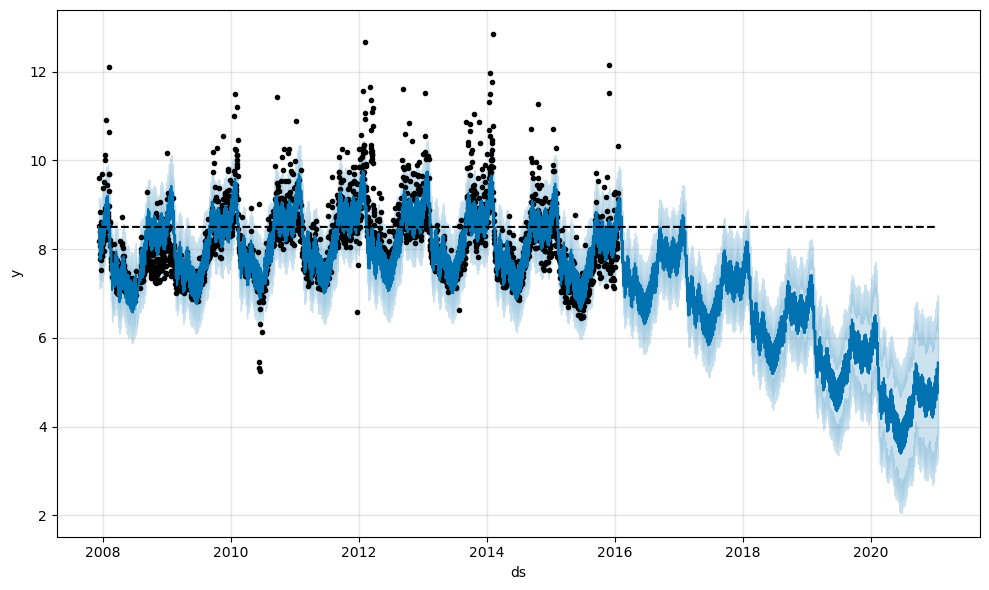

In [88]:
future = m.make_future_dataframe(periods=1826)
future['cap'] = 8.5
fcst = m.predict(future)
fig = m.plot(fcst)

10:54:47 - cmdstanpy - INFO - Chain [1] start processing
10:54:47 - cmdstanpy - INFO - Chain [1] done processing


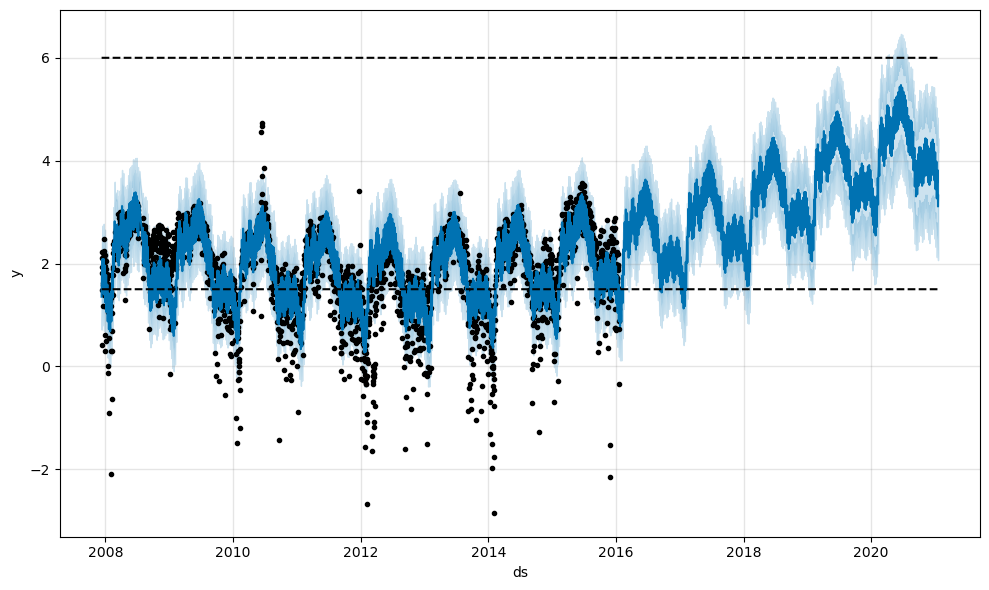

In [89]:
# Python
df['y'] = 10 - df['y']
df['cap'] = 6
df['floor'] = 1.5
future['cap'] = 6
future['floor'] = 1.5
m = Prophet(growth='logistic')
m.fit(df)
fcst = m.predict(future)
fig = m.plot(fcst)